### **Setting up environment** <br>
We install HuggingFace Transformers and Detectron2.

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
!pip install -q pyyaml==5.1
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 
!pip install -q torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# install detectron2 that matches pytorch 1.8
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install -q detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
!python -m pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

  Preparing metadata (setup.py) ... done


In [3]:
!pip install -q datasets

**Install PyTesseract**

In [4]:
! sudo apt install tesseract-ocr
! pip install -q pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 21 not upgraded.


**Uploading and Unzipping Dataset**

In [5]:
from google.colab import files
uploaded=files.upload()

Saving Unsript_dataset.zip to Unsript_dataset.zip


In [6]:
! unzip Unsript_dataset.zip 

Archive:  Unsript_dataset.zip
   creating: Final_Dataset/
   creating: Final_Dataset/train/
   creating: Final_Dataset/train/Bad_Images/
  inflating: Final_Dataset/train/Bad_Images/B7.jpg  
  inflating: Final_Dataset/train/Bad_Images/B2.jpg  
  inflating: Final_Dataset/train/Bad_Images/istockphoto-1009864658-612x612.jpg  
  inflating: Final_Dataset/train/Bad_Images/B6.jpg  
  inflating: Final_Dataset/train/Bad_Images/B1.jpg  
  inflating: Final_Dataset/train/Bad_Images/B4.jpg  
  inflating: Final_Dataset/train/Bad_Images/B10.jpg  
  inflating: Final_Dataset/train/Bad_Images/Screenshot 2023-02-12 083559.jpg  
  inflating: Final_Dataset/train/Bad_Images/B3.jpg  
  inflating: Final_Dataset/train/Bad_Images/Screenshot 2023-02-12 083748.jpg  
  inflating: Final_Dataset/train/Bad_Images/B5.jpg  
   creating: Final_Dataset/train/Good_Images/
  inflating: Final_Dataset/train/Good_Images/G12.jpg  
  inflating: Final_Dataset/train/Good_Images/G7.jpg  
  inflating: Final_Dataset/train/Good_Images

In [5]:
!pip install Pillow==9.0.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


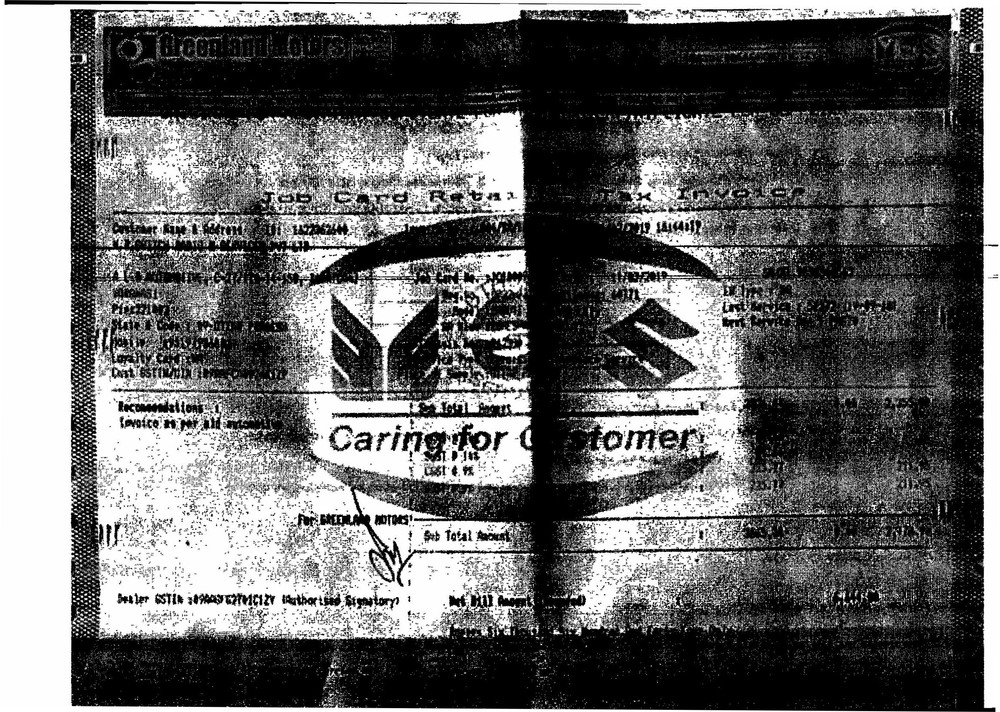

In [52]:
from PIL import Image, ImageDraw, ImageFont

image = Image.open("/content/Final_Dataset/test/VeryBad_Images/VB12.jpg")
image = image.convert("RGB")
image

**We use the Tesseract OCR engine to turn the image into a list of recognized words**

In [7]:
import pytesseract
import numpy as np

ocr_df = pytesseract.image_to_data(image, output_type='data.frame')
ocr_df = ocr_df.dropna().reset_index(drop=True)
float_cols = ocr_df.select_dtypes('float').columns
ocr_df[float_cols] = ocr_df[float_cols].round(0).astype(int)
ocr_df = ocr_df.replace(r'^\s*$', np.nan, regex=True)
words = ' '.join([word for word in ocr_df.text if str(word) != 'nan'])
words

'By ci 3 Sealer 6STis Siac ieee’ OTR 6 SRNR TORN ORES TS AEE ROR EN'

**However, we can use LayoutLMv2Processor to easily prepare the data for the model. We give a document image as input to the processor, and it will create input_ids, attention_mask, token_type_ids and bbox for us. Internally, it will apply PyTesseract to get the words and bounding boxes, it will normalize the bounding boxes according to the size of the image, and it will turn everything into token-level inputs. It will also resize the document image to 224x224, as the model also requires an image input.**

In [8]:
from transformers import LayoutLMv2FeatureExtractor, LayoutLMv2Tokenizer, LayoutLMv2Processor

feature_extractor = LayoutLMv2FeatureExtractor()
tokenizer = LayoutLMv2Tokenizer.from_pretrained("microsoft/layoutlmv2-base-uncased")
processor = LayoutLMv2Processor(feature_extractor, tokenizer)


/usr/local/lib/python3.8/dist-packages/transformers/models/layoutlmv2/feature_extraction_layoutlmv2.py:30: FutureWarning: The class LayoutLMv2FeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use LayoutLMv2ImageProcessor instead.
  warnings.warn(


In [9]:
encoded_inputs = processor(image, return_tensors="pt")

In [10]:
for k,v in encoded_inputs.items():
  print(k, v.shape)

input_ids torch.Size([1, 27])
bbox torch.Size([1, 27, 4])
token_type_ids torch.Size([1, 27])
attention_mask torch.Size([1, 27])
image torch.Size([1, 3, 224, 224])


In [11]:
processor.tokenizer.decode(encoded_inputs.input_ids.squeeze().tolist())

'[CLS] by ci 3 sealer 6stis siac ieee ’ otr 6 srnr torn ores ts aee ror en [SEP]'

# **Preprocessing the data using datasets** <br>
First, we convert the dataset into a Pandas dataframe, having 2 columns: image_path and label.

In [12]:
import pandas as pd
import os

dataset_path = "/content/Final_Dataset/train/"
labels = [label for label in os.listdir(dataset_path)]
labels1 = labels
print(labels)
id2label = {v: k for v, k in enumerate(labels)}
label2id = {k: v for v, k in enumerate(labels)}
label2id

['Bad_Images', 'Good_Images', 'VeryGood_Images', 'VeryBad_Images']


{'Bad_Images': 0, 'Good_Images': 1, 'VeryGood_Images': 2, 'VeryBad_Images': 3}

In [15]:

images = []
labels = []

for label_folder, _, file_names in os.walk(dataset_path):
  #print(label_folder)
  if label_folder != dataset_path:
    label = label_folder[29:]
    for _, _, image_names in os.walk(label_folder):
      relative_image_names = []
      for image_file in image_names:
        relative_image_names.append(dataset_path + "/" + label + "/" + image_file)
      images.extend(relative_image_names)
      labels.extend([label] * len (relative_image_names)) 

data = pd.DataFrame.from_dict({'image_path': images, 'label': labels})
data.head()

,image_path,label
0,/content/Final_Dataset/train//Bad_Images/B7.jpg,Bad_Images
1,/content/Final_Dataset/train//Bad_Images/B1.jpg,Bad_Images
2,/content/Final_Dataset/train//Bad_Images/B2.jpg,Bad_Images
3,/content/Final_Dataset/train//Bad_Images/istoc...,Bad_Images
4,/content/Final_Dataset/train//Bad_Images/B10.jpg,Bad_Images


In [16]:
from datasets import Dataset 

# read dataframe as HuggingFace Datasets object
dataset = Dataset.from_pandas(data)


In [17]:
dataset

Dataset({
    features: ['image_path', 'label'],
    num_rows: 78
})

In [18]:
from datasets import Features, Sequence, ClassLabel, Value, Array2D, Array3D

# we need to define custom features
features = Features({
    'image': Array3D(dtype="int64", shape=(3, 224, 224)),
    'input_ids': Sequence(feature=Value(dtype='int64')),
    'attention_mask': Sequence(Value(dtype='int64')),
    'token_type_ids': Sequence(Value(dtype='int64')),
    'bbox': Array2D(dtype="int64", shape=(512, 4)),
    'labels': ClassLabel(num_classes=4, names=labels1),
})

def preprocess_data(examples):
  # take a batch of images
  images = [Image.open(path).convert("RGB") for path in examples['image_path']]
  
  encoded_inputs = processor(images, padding="max_length", truncation=True)
  
  # add labels
  encoded_inputs["labels"] = [label2id[label] for label in examples["label"]]

  return encoded_inputs

encoded_dataset = dataset.map(preprocess_data, remove_columns=dataset.column_names, features=features, 
                              batched=True, batch_size=2)

  0%|          | 0/39 [00:00<?, ?ba/s]

**We set the format to PyTorch tensors. We also specify to put everything on the GPU (CUDA)**

In [19]:
encoded_dataset.set_format(type="torch", device="cuda")

In [20]:
import torch

dataloader = torch.utils.data.DataLoader(encoded_dataset, batch_size=4)
batch = next(iter(dataloader))

In [21]:
for k,v in batch.items():
  print(k, v.shape)
     

image torch.Size([4, 3, 224, 224])
input_ids torch.Size([4, 512])
attention_mask torch.Size([4, 512])
token_type_ids torch.Size([4, 512])
bbox torch.Size([4, 512, 4])
labels torch.Size([4])


In [22]:
processor.tokenizer.decode(batch['input_ids'][0].tolist())

'[CLS] ¢ ef ostirlen rgbhnf ke 5 labour deaanded reaairs recoaaendations + at flesler ostin : o4gaachssotmiek authorised signatory! jobe done & ae & address | id : automotive put utd arpaagy, foag2e 7 repairs : ( authorised maruti dealer ) ag k. m. stone, sirsa road, hisar - 125001 ~ ph. : bgozz7 % 82g, 2, for insurance “ i8go7777045 - abt bo 8607777043 - 44, email hissa hs : sees : com lavoice na. i are tere dab card no. 23018900099 " aaa peu rcar hor / gag fy. for kissar aitonibiles! - - — < - - — = ~ gervice carried cu [ 06996 leila ea a ig wes : oe maruti suzuki - © “ caring for customers, : ) fi j ) ‘ 792. 4 7 ie sae st } } is a ) 4. 28 40. 48 ) 949. 90 ee ly de sat fit any unapproved pig a2 and | an receiving the < ehacle post completion of regaacs / service peafuble - 940 - 46 iat 1900. 02 / — ~ pn camila sn gel sue 28h 0 48,. & tbeztl4 [ tue [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] 

In [23]:
id2label[batch['labels'][0].item()]

'Bad_Images'

#Define the model 
**Here we define the model, namely LayoutLMv2ForSequenceClassification. We initialize it with the weights of the pre-trained base model (LayoutLMModel). The weights of the classification head are randomly initialized, and will be fine-tuned together with the weights of the base model on our tiny dataset. Once loaded, we move it to the GPU.**

In [24]:
from transformers import LayoutLMv2ForSequenceClassification
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = LayoutLMv2ForSequenceClassification.from_pretrained("microsoft/layoutlmv2-base-uncased", 
                                                            num_labels=len(labels))
model.to(device)

Some weights of the model checkpoint at microsoft/layoutlmv2-base-uncased were not used when initializing LayoutLMv2ForSequenceClassification: ['layoutlmv2.visual.backbone.bottom_up.res3.0.conv2.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res4.21.conv3.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res4.0.shortcut.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res5.0.conv3.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res5.2.conv2.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res4.18.conv1.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res3.3.conv2.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res4.2.conv2.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res4.11.conv2.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.stem.conv1.norm.num_batches_tracked', 'layoutlmv2.visual.backbone.bottom_up.res4.14.conv1.norm.num_batches_tra

LayoutLMv2ForSequenceClassification(
  (layoutlmv2): LayoutLMv2Model(
    (embeddings): LayoutLMv2Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (x_position_embeddings): Embedding(1024, 128)
      (y_position_embeddings): Embedding(1024, 128)
      (h_position_embeddings): Embedding(1024, 128)
      (w_position_embeddings): Embedding(1024, 128)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (visual): LayoutLMv2VisualBackbone(
      (backbone): FPN(
        (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
        (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
        (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

# Train the model
**Here we train the model in familiar PyTorch fashion. We use the Adam optimizer with weight decay fix (normally you can also specify which variables should have weight decay and which not + a learning rate scheduler, see here for how the authors of LayoutLM did this), and train for 30 epochs. If the model is able to overfit it, then it means there are no issues and we can train it on the entire dataset.**

In [25]:
from transformers import AdamW
from tqdm.notebook import tqdm

optimizer = AdamW(model.parameters(), lr=5e-5)

global_step = 0
num_train_epochs = 20
t_total = len(dataloader) * num_train_epochs # total number of training steps 

#put the model in training mode
model.train()
for epoch in range(num_train_epochs):
  print("Epoch:", epoch)
  running_loss = 0.0
  correct = 0
  for batch in tqdm(dataloader):
      # forward pass
      outputs = model(**batch)
      loss = outputs.loss

      running_loss += loss.item()
      predictions = outputs.logits.argmax(-1)
      correct += (predictions == batch['labels']).float().sum()

      # backward pass to get the gradients 
      loss.backward()

      # update
      optimizer.step()
      optimizer.zero_grad()
      global_step += 1
  
  print("Loss:", running_loss / batch["input_ids"].shape[0])
  accuracy = 100 * correct / len(data)
  print("Training accuracy:", accuracy.item())

Epoch: 0


/usr/local/lib/python3.8/dist-packages/transformers/optimization.py:346: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 35.9617994427681
Training accuracy: 20.512821197509766
Epoch: 1


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 22.272032290697098
Training accuracy: 43.589744567871094
Epoch: 2


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 16.876501232385635
Training accuracy: 41.02564239501953
Epoch: 3


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 17.6314717233181
Training accuracy: 43.589744567871094
Epoch: 4


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 16.06630477309227
Training accuracy: 29.487180709838867
Epoch: 5


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 14.017038851976395
Training accuracy: 52.56410217285156
Epoch: 6


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 13.605994775891304
Training accuracy: 51.28205108642578
Epoch: 7


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 13.192741453647614
Training accuracy: 57.69231033325195
Epoch: 8


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 10.613314375281334
Training accuracy: 65.38461303710938
Epoch: 9


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 11.387446083128452
Training accuracy: 57.69231033325195
Epoch: 10


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 9.89303620159626
Training accuracy: 70.51282501220703
Epoch: 11


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 9.130855940282345
Training accuracy: 70.51282501220703
Epoch: 12


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 8.82080002874136
Training accuracy: 69.23077392578125
Epoch: 13


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 7.694383334368467
Training accuracy: 69.23077392578125
Epoch: 14


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 8.734404411166906
Training accuracy: 66.66666412353516
Epoch: 15


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 7.52735497802496
Training accuracy: 71.79487609863281
Epoch: 16


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 7.25265596434474
Training accuracy: 70.51282501220703
Epoch: 17


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 7.1703786086291075
Training accuracy: 66.66666412353516
Epoch: 18


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 6.01995350793004
Training accuracy: 71.79487609863281
Epoch: 19


  0%|          | 0/20 [00:00<?, ?it/s]

Loss: 6.602704894728959
Training accuracy: 69.23077392578125


# Inference
To perform inference on a new document image, 3 things need to be done:




*   prepare the image for the model using LayoutLMv2Processor
*   forward pass through the model
*   convert the output of the model to an actual label name 


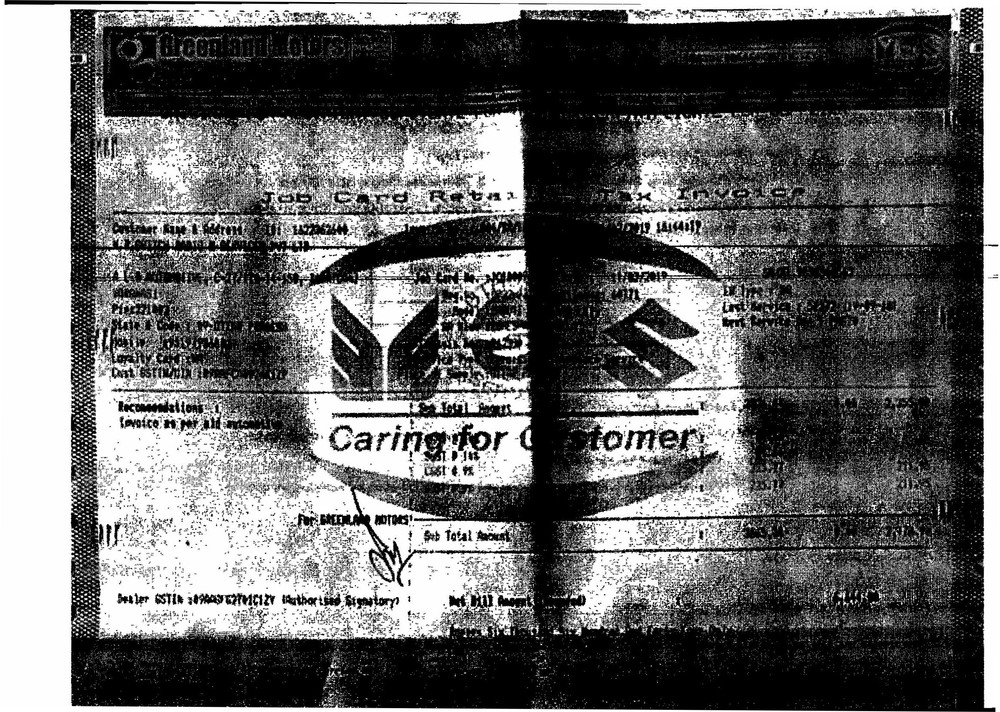

In [53]:
image

In [54]:
# prepare image for the model
encoded_inputs = processor(image, return_tensors="pt")

# make sure all keys of encoded_inputs are on the same device as the model
for k,v in encoded_inputs.items():
  encoded_inputs[k] = v.to(model.device)

# forward pass?
outputs = model(**encoded_inputs)

The model outputs logits of shape (batch_size, num_labels):

In [55]:
logits = outputs.logits
print(logits.shape)
     

torch.Size([1, 78])


**We take the largest logit (i.e. argmax on the last dimension), and convert it back to a string using the id2label dictionary we created earlier.**

In [56]:
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", id2label[predicted_class_idx])

Predicted class: VeryBad_Images
